In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.2/910.2 kB 29.4 MB/s eta 0:00:00


In [ ]:
# Vehicle Classification and Detection Project
# Objective: Detect and classify vehicles in images and videos using YOLOv8.

import kagglehub
import os
import shutil
import numpy as np
import random
import yaml
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
from collections import Counter
from PIL import Image
from albumentations import Compose, Rotate, HorizontalFlip, RandomBrightnessContrast, ShiftScaleRotate

# Step 1: Dataset Preparation and Augmentation
# Step 1.1: Download Dataset
print("Downloading dataset...")
dataset_path = kagglehub.dataset_download("sakshamjn/vehicle-detection-8-classes-object-detection")
print(f"Dataset downloaded to: {dataset_path}")

# Step 1.2: Split Dataset
source_images = os.path.join(dataset_path, 'train/images')
source_labels = os.path.join(dataset_path, 'train/labels')
destination_root = '/kaggle/working/dataset'
os.makedirs(os.path.join(destination_root, 'train/images'), exist_ok=True)
os.makedirs(os.path.join(destination_root, 'train/labels'), exist_ok=True)
os.makedirs(os.path.join(destination_root, 'test/images'), exist_ok=True)
os.makedirs(os.path.join(destination_root, 'test/labels'), exist_ok=True)

images = [f for f in os.listdir(source_images) if f.endswith('.jpg')]
labels = [f.replace('.jpg', '.txt') for f in images]

train_images, test_images, train_labels, test_labels = train_test_split(images, labels, test_size=0.2, random_state=42)

# Augment underrepresented classes (e.g., Motorcycle and LCV)
underrepresented_classes = [4, 3]  # Class IDs for Motorcycle and LCV
# Define augmented images and labels directories
augmented_images_dir = os.path.join(destination_root, 'augmented', 'images')
augmented_labels_dir = os.path.join(destination_root, 'augmented', 'labels')

# Ensure both directories exist
os.makedirs(augmented_images_dir, exist_ok=True)
os.makedirs(augmented_labels_dir, exist_ok=True)

def augment_image(image_path, label_path, images_output_dir, labels_output_dir, augmentations, num_augments=5):
    """Applies augmentations to an image and saves the augmented versions."""
    image = cv2.imread(image_path)
    height, width, _ = image.shape

    # Read and duplicate label
    with open(label_path, 'r') as f:
        label_data = f.readlines()

    for i in range(num_augments):
        augmented = augmentations(image=image)
        aug_image = augmented['image']

        # Save augmented image
        aug_image_name = f"aug_{i}_{os.path.basename(image_path)}"
        aug_image_path = os.path.join(images_output_dir, aug_image_name)
        cv2.imwrite(aug_image_path, aug_image)

        # Save corresponding label
        aug_label_name = f"aug_{i}_{os.path.basename(label_path)}"
        aug_label_path = os.path.join(labels_output_dir, aug_label_name)
        with open(aug_label_path, 'w') as f:
            f.writelines(label_data)

# Define augmentations for underrepresented classes
augmentations = Compose([
    Rotate(limit=30, p=0.5),
    HorizontalFlip(p=0.5),
    RandomBrightnessContrast(p=0.5),
    ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=30, p=0.5)
])

# Apply augmentations to underrepresented classes
for img, lbl in zip(train_images, train_labels):
    label_path = os.path.join(source_labels, lbl)
    image_path = os.path.join(source_images, img)

    with open(label_path, 'r') as f:
        label_data = f.readlines()

    if any(int(line.split()[0]) in underrepresented_classes for line in label_data):
        augment_image(image_path, label_path, augmented_images_dir, augmented_labels_dir, augmentations)


# Combine original and augmented datasets
print("Combining original and augmented datasets...")
for img, lbl in zip(train_images, train_labels):
    shutil.copy(os.path.join(source_images, img), os.path.join(destination_root, 'train/images', img))
    shutil.copy(os.path.join(source_labels, lbl), os.path.join(destination_root, 'train/labels', lbl))

# Copy augmented images and labels
for img in os.listdir(augmented_images_dir):
    shutil.copy(os.path.join(augmented_images_dir, img), os.path.join(destination_root, 'train/images', img))

for lbl in os.listdir(augmented_labels_dir):
    shutil.copy(os.path.join(augmented_labels_dir, lbl), os.path.join(destination_root, 'train/labels', lbl))

print("Original and augmented datasets combined successfully.")


# Step 1.3: Create YAML Configuration
config = {
    'train': os.path.join(destination_root, 'train/images'),
    'val': os.path.join(destination_root, 'test/images'),
    'names': ['auto', 'bus', 'car', 'lcv', 'motorcycle', 'multiaxle', 'tractor', 'truck']
}
yaml_path = os.path.join(destination_root, 'data.yaml')
with open(yaml_path, 'w') as file:
    yaml.dump(config, file)
print("YAML configuration file created.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


100%|██████████| 346M/346M [00:10<00:00, 34.9MB/s]

Extracting files...


Dataset downloaded to: /root/.cache/kagglehub/datasets/sakshamjn/vehicle-detection-8-classes-object-detection/versions/1
Combining original and augmented datasets...
Original and augmented datasets combined successfully.
YAML configuration file created.


In [ ]:
for img, lbl in zip(test_images, test_labels):
    shutil.copy(os.path.join(source_images, img), os.path.join(destination_root, 'test/images', img))
    shutil.copy(os.path.join(source_labels, lbl), os.path.join(destination_root, 'test/labels', lbl))


In [5]:
# Step 2: Train YOLOv8 Model
print("Starting YOLOv8 training...")
model = YOLO('yolov8n.pt')  # Load YOLOv8n pretrained weights

results = model.train(
    data=yaml_path,  # Path to the data.yaml file
    epochs=20,  # Increased epochs for better convergence
    imgsz=640,  # Input image size
    batch=32,  # Batch size
    device=0,  # Use GPU (device=0)
    optimizer='AdamW',  # Use AdamW optimizer for better convergence
    lr0=0.001  # Learning rate
)

# Save the trained model
model_path = os.path.join('/kaggle/working', 'balanced_model.pt')
model.save(model_path)
print(f"Model training completed. Balanced model saved at {model_path}.")


Starting YOLOv8 training...


100%|██████████| 6.25M/6.25M [00:00<00:00, 148MB/s]


Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/dataset/data.yaml, epochs=20, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_

100%|██████████| 755k/755k [00:00<00:00, 40.9MB/s]


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 148MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/dataset/train/labels... 25209 images, 15 backgrounds, 0 corrupt: 100%|██████████| 25209/25209 [00:13<00:00, 1840.74it/s]

train: WARNING ⚠️ /kaggle/working/dataset/train/images/highway_2784_2020-08-26.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/dataset/train/images/highway_3297_2020-08-26.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/dataset/test/labels... 1644 images, 3 backgrounds, 0 corrupt: 100%|██████████| 1644/1644 [00:02<00:00, 646.92it/s]


val: New cache created: /kaggle/working/dataset/test/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      4.31G      2.238      2.952      1.605        120        640: 100%|██████████| 788/788 [09:18<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:19<00:00,  1.35it/s]


                   all       1644       5312      0.345      0.512       0.37      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      4.08G      2.092      2.612      1.545        132        640: 100%|██████████| 788/788 [09:12<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:23<00:00,  1.12it/s]


                   all       1644       5312       0.43      0.649      0.491      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.18G       2.04      2.512      1.519        116        640: 100%|██████████| 788/788 [08:53<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.37it/s]


                   all       1644       5312      0.481      0.653      0.548      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      4.11G      2.022      2.461      1.508        163        640: 100%|██████████| 788/788 [08:45<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


                   all       1644       5312      0.521      0.591      0.512      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      4.11G      1.961      2.382      1.479        149        640: 100%|██████████| 788/788 [08:51<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.47it/s]


                   all       1644       5312      0.583      0.625      0.605      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      4.19G      1.929      2.324      1.461        157        640: 100%|██████████| 788/788 [08:49<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]


                   all       1644       5312      0.627      0.693      0.673      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      4.09G      1.909      2.303       1.45        132        640: 100%|██████████| 788/788 [08:45<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.41it/s]


                   all       1644       5312      0.665      0.689      0.686      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      4.19G      1.877      2.246      1.429        143        640: 100%|██████████| 788/788 [08:46<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.41it/s]

                   all       1644       5312      0.669      0.692      0.685       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      4.18G      1.859      2.221      1.422        115        640: 100%|██████████| 788/788 [08:45<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.48it/s]


                   all       1644       5312       0.65      0.706      0.706      0.451

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      4.16G      1.838      2.193      1.412        136        640: 100%|██████████| 788/788 [08:43<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


                   all       1644       5312      0.662      0.702        0.7      0.453
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      4.14G      1.811      2.163      1.465         93        640: 100%|██████████| 788/788 [08:26<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


                   all       1644       5312      0.691      0.739      0.743      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         4G       1.78      2.117      1.443         97        640: 100%|██████████| 788/788 [08:22<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


                   all       1644       5312      0.702      0.735      0.747      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         4G      1.763      2.086      1.427         97        640: 100%|██████████| 788/788 [08:36<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:18<00:00,  1.42it/s]


                   all       1644       5312       0.72      0.705      0.753        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         4G      1.744      2.055      1.414        104        640: 100%|██████████| 788/788 [08:30<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]

                   all       1644       5312      0.713      0.712      0.755      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.99G      1.724      2.026      1.403         82        640: 100%|██████████| 788/788 [08:20<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.47it/s]

                   all       1644       5312      0.714      0.748      0.768      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.99G      1.711      2.002       1.39         77        640: 100%|██████████| 788/788 [08:21<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.49it/s]


                   all       1644       5312      0.725      0.734      0.766      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.99G      1.693      1.982      1.384         99        640: 100%|██████████| 788/788 [08:19<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.47it/s]


                   all       1644       5312      0.715      0.756      0.767      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.99G      1.677      1.954      1.367         88        640: 100%|██████████| 788/788 [08:15<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.50it/s]


                   all       1644       5312      0.708      0.786      0.776      0.524

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.99G      1.663      1.933      1.357         96        640: 100%|██████████| 788/788 [08:24<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.45it/s]

                   all       1644       5312      0.723       0.77      0.778      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.99G      1.648      1.908      1.349         83        640: 100%|██████████| 788/788 [08:34<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.50it/s]

                   all       1644       5312      0.734      0.756      0.778       0.53



20 epochs completed in 2.995 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:23<00:00,  1.10it/s]


                   all       1644       5312      0.735      0.757      0.778      0.529
                  auto        153        169       0.72      0.817      0.809      0.502
                   bus        242        260      0.784      0.785      0.806      0.618
                   car       1168       2373      0.857       0.91      0.925      0.634
                   lcv        171        179      0.561      0.543      0.549      0.416
            motorcycle        829       1468        0.8      0.783       0.85      0.451
             multiaxle        223        236      0.583      0.633      0.662      0.513
               tractor         47         47      0.944      0.851      0.915      0.586
                 truck        508        580      0.631      0.735       0.71      0.514
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/train
Model training completed. Balanced model saved at /kaggle/working/balanced_model.p

For 20 epochs, the results are reasonable, but there is significant room for improvement, especially for challenging classes like LCV and Motorcycle

Visualizing dataset samples:


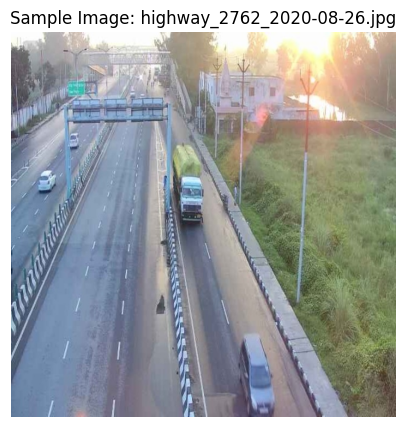

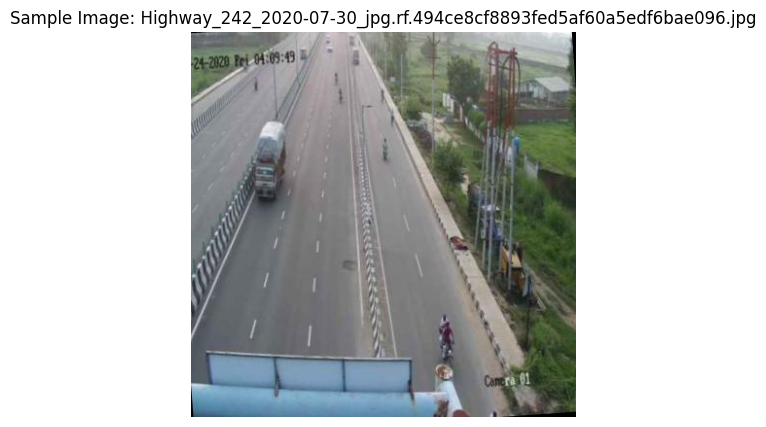

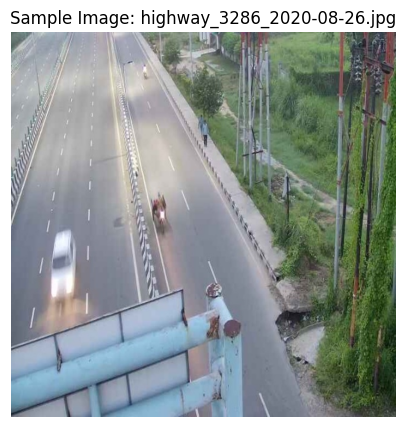

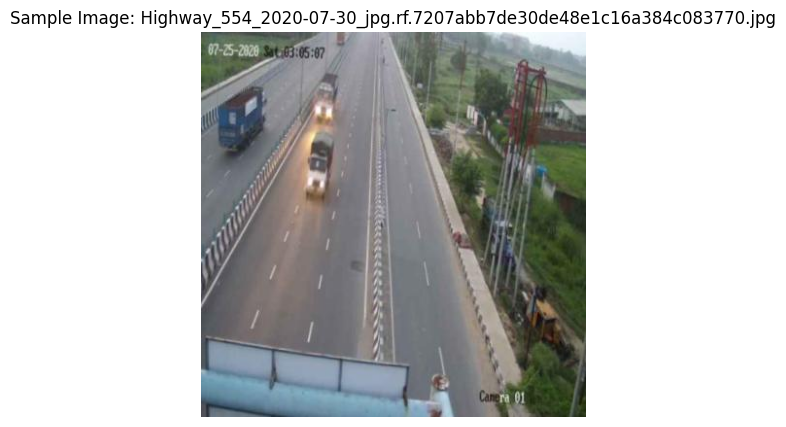

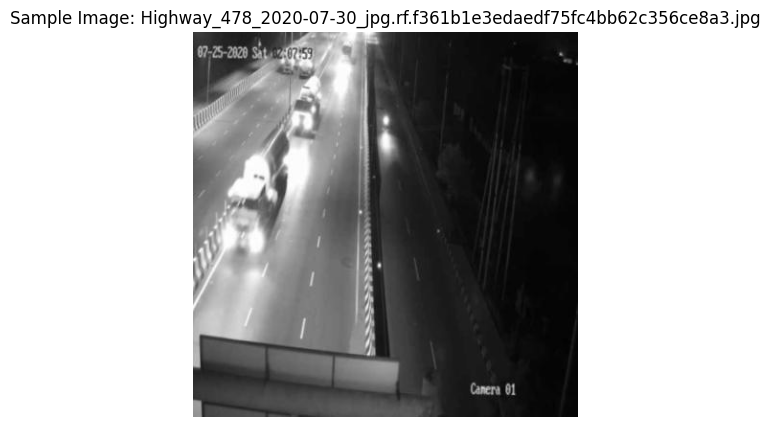

In [6]:
import random
from PIL import Image

def visualize_samples(images_path, sample_count=5):
    image_files = [os.path.join(images_path, img) for img in os.listdir(images_path) if img.endswith('.jpg')]
    sample_images = random.sample(image_files, min(sample_count, len(image_files)))

    for image_path in sample_images:
        img = Image.open(image_path)
        plt.figure(figsize=(5, 5))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Sample Image: {os.path.basename(image_path)}")
        plt.show()

train_images_path = os.path.join(dataset_path, 'train/images')
print("Visualizing dataset samples:")
visualize_samples(train_images_path)

In [7]:
# Step 3: Evaluate Model and Analyze Results
print("Evaluating model...")
evaluation_results = model.val()
print(evaluation_results)


Evaluating model...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/dataset/test/labels.cache... 1644 images, 3 backgrounds, 0 corrupt: 100%|██████████| 1644/1644 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [00:25<00:00,  2.04it/s]


                   all       1644       5312      0.732       0.76      0.778      0.528
                  auto        153        169      0.715      0.818       0.81      0.501
                   bus        242        260      0.778      0.785      0.805      0.618
                   car       1168       2373      0.857      0.912      0.925      0.634
                   lcv        171        179       0.56      0.547       0.55      0.416
            motorcycle        829       1468      0.795      0.788      0.848      0.452
             multiaxle        223        236      0.574       0.64      0.661      0.513
               tractor         47         47      0.942      0.851      0.915      0.581
                 truck        508        580      0.631      0.739       0.71      0.512
Speed: 0.3ms preprocess, 4.2ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: arr

Overall Performance:

Precision: 0.732 - Indicates that when the model predicts a detection, it is correct 73.2% of the time.
Recall: 0.76 - Indicates that the model correctly identifies 76% of all instances in the test set.
mAP@50: 0.778 - Mean Average Precision at IoU=0.5, indicating good overall detection quality.
mAP@50-95: 0.528 - A stricter evaluation metric (averaging over multiple IoU thresholds), which is reasonably good but has room for improvement.
Per-Class Performance:

Best Performing Classes:
Car: Precision (0.857), Recall (0.912), mAP@50 (0.925), mAP@50-95 (0.634). This class is detected most accurately, suggesting it is well-represented in the dataset or easier to distinguish.
Bus: High precision (0.778) and recall (0.785), with mAP@50-95 (0.618), indicating solid performance.
Tractor: High precision (0.942) and good recall (0.851), with mAP@50 (0.915) and mAP@50-95 (0.581).
Challenging Classes:
LCV (Light Commercial Vehicle): Low precision (0.56) and recall (0.547), with mAP@50-95 (0.416), suggesting the model struggles to differentiate this class, possibly due to overlapping features with other vehicle types.
Motorcycle: Reasonable precision (0.795) and recall (0.788), but mAP@50-95 (0.452) indicates it may be harder to localize accurately.
Multiaxle Vehicles: Precision (0.574), recall (0.64), and mAP@50-95 (0.513) are moderate, showing room for improvement in detecting this class.
Speed:

Inference Time: 4.2 ms per image, indicating the model is computationally efficient for real-time applications.

Analyzing data...


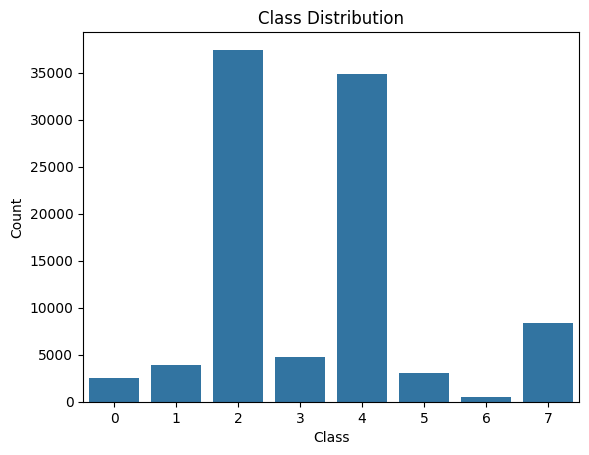

In [8]:
# Step 3: Data Analysis and Visualization
print("Analyzing data...")
def count_classes(labels_path):
    class_counts = Counter()
    for label_file in os.listdir(labels_path):
        with open(os.path.join(labels_path, label_file), 'r') as f:
            for line in f:
                class_id = int(line.split()[0])
                class_counts[class_id] += 1
    return class_counts

train_labels_path = os.path.join(destination_root, 'train/labels')
class_counts = count_classes(train_labels_path)

sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()


image 1/1 /kaggle/working/dataset/test/images/ulu1345_jpg.rf.4f6eae1a1ef5f0bed0f955065e8fd1fc.jpg: 640x640 2 motorcycles, 1 multiaxle, 1 truck, 20.9ms
Speed: 4.5ms preprocess, 20.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


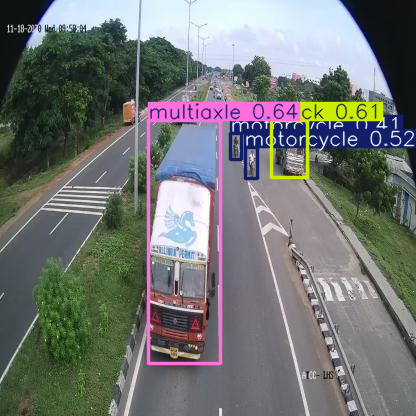


image 1/1 /kaggle/working/dataset/test/images/Highway_117_2020-07-30_jpg.rf.46d77343ef898e15519abd22dc1c45ee.jpg: 640x640 1 motorcycle, 1 truck, 15.1ms
Speed: 4.2ms preprocess, 15.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


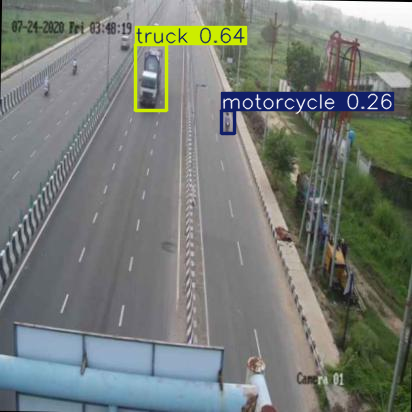


image 1/1 /kaggle/working/dataset/test/images/Highway_1208_2020-07-30_jpg.rf.8ae6d0b470cec83e049b81a7d50af283.jpg: 640x640 1 car, 1 lcv, 1 tractor, 12.8ms
Speed: 5.5ms preprocess, 12.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


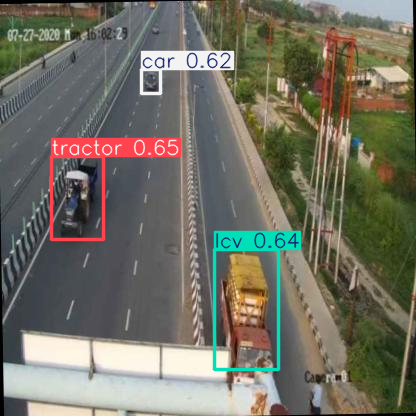


image 1/1 /kaggle/working/dataset/test/images/Highway_799_2020-07-30_jpg.rf.da70119994537c5f75d32de63c449090.jpg: 640x640 1 car, 1 motorcycle, 1 multiaxle, 13.8ms
Speed: 7.4ms preprocess, 13.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


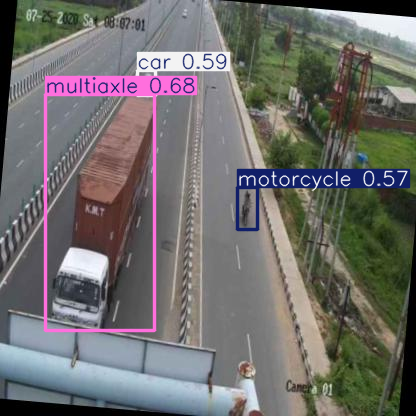


image 1/1 /kaggle/working/dataset/test/images/highway_3661_2020-08-26.jpg: 480x640 2 autos, 2 cars, 1 motorcycle, 1 tractor, 64.7ms
Speed: 2.1ms preprocess, 64.7ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


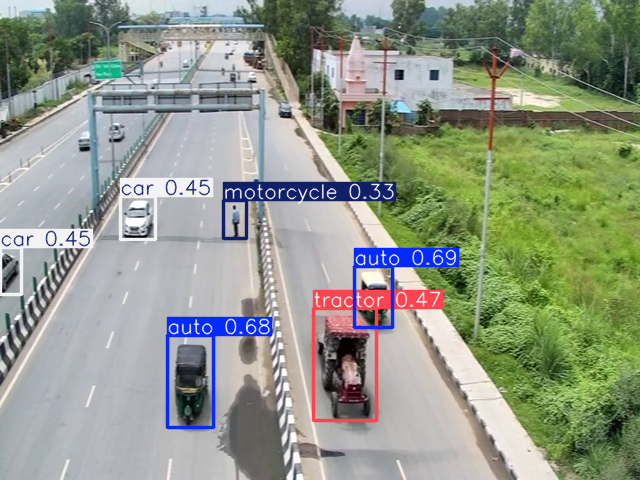

In [9]:
# Step 5: Model Inference & Generalization Assessment

# 5.1: Inference on Validation Set Images
val_images_path = os.path.join(destination_root, 'test/images')
val_images = [os.path.join(val_images_path, img) for img in os.listdir(val_images_path) if img.endswith('.jpg')]

for img_path in val_images[:5]:  # Limit to first 5 images for demonstration
    results = model.predict(img_path)
    results[0].plot(show=True)

In [15]:
print("YOLOv8 results:", results)


Streaming output truncated to the last 5000 lines.
       [[ 93,  99, 103],
        [ 88,  94,  98],
        [ 82,  88,  92],
        ...,
        [ 87,  99, 104],
        [ 87,  99, 104],
        [ 87,  99, 104]],

       [[ 94, 100, 104],
        [ 88,  94,  98],
        [ 82,  88,  92],
        ...,
        [ 87,  99, 104],
        [ 87,  99, 104],
        [ 87,  99, 104]]], dtype=uint8)
orig_shape: (720, 1280)
path: '/content/sample_video.mp4'
probs: None
save_dir: 'runs/detect/train3'
speed: {'preprocess': 2.1865367889404297, 'inference': 7.895469665527344, 'postprocess': 0.6535053253173828}, ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'auto', 1: 'bus', 2: 'car', 3: 'lcv', 4: 'motorcycle', 5: 'multiaxle', 6: 'tractor', 7: 'truck'}
obb: None
orig_img: array([[[247, 243, 233],
        [248, 244, 234],
        [252, 248, 238],
        ...,
        [204, 171, 154],
        [204, 171, 

In [17]:
#inference on unseenn video
import os
from IPython.display import Video

# Define input and output video paths
video_input_path = '/content/sample_video.mp4'
video_output_path = '/content/processed_sample_video.mp4'

# Ensure the input video exists
if not os.path.exists(video_input_path):
    raise FileNotFoundError(f"Input video not found at {video_input_path}.")

print("Running YOLOv8 inference on the video...")

# Run YOLOv8 inference
results = model.predict(source=video_input_path, save=True, conf=0.3)

# Define the directory based on YOLOv8 output
avi_output_dir = '/content/runs/detect/train3'  # Output directory from YOLOv8
video_output_path = '/content/processed_sample_video.mp4'

# Ensure the output directory exists
if not os.path.exists(avi_output_dir):
    raise FileNotFoundError(f"YOLOv8 output directory not found at {avi_output_dir}.")

# Locate the processed .avi video file
avi_file = [f for f in os.listdir(avi_output_dir) if f.endswith('.avi')]

if avi_file:
    avi_file_path = os.path.join(avi_output_dir, avi_file[0])
    print(f"Converting .avi file to .mp4: {avi_file_path}")

    # Fix locale settings for UTF-8
    os.environ["PYTHONIOENCODING"] = "utf-8"
    os.environ["LANG"] = "C.UTF-8"
    os.environ["LC_ALL"] = "C.UTF-8"

    # Convert .avi to .mp4 using FFmpeg
    os.system(f'ffmpeg -y -loglevel panic -i "{avi_file_path}" "{video_output_path}"')
else:
    raise FileNotFoundError("Processed .avi file not found in YOLOv8 output directory.")

# Check and display the processed video
if os.path.exists(video_output_path):
    print("Processed video available for viewing:")
    display(Video(video_output_path, embed=True, width=960))
else:
    print("No processed video found. Check the inference step.")


Running YOLOv8 inference on the video...


WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) /content/sample_video.mp4: 384x640 (no detections), 8.9ms
video 1/1 (frame 2/601) /content/sample_video.mp4: 384x640 (no detections), 6.6ms
video 1/1 (frame 3/601) /content/sample_video.mp4: 384x640 (no detections), 6.7ms
video 1/1 (frame 4/601) /content/sample_video.mp4: 384x640 (no detections), 6.9ms
video 1/1 (frame 5/601) /content/sample_video.mp4: 384x640 (no detections), 10.0ms
vide